# Calculate the winnings (in US Dollars) by extracting the lotto ticket numbers from the lotto ticket pictures.
The code runs text recognition on the Lotto ticket pictures (shot with a smartphone) to extract the Lotto ticket values (draw date, numbers, and multiplier). It then compares them to the winning numbers drawn on the draw date to determine the prize ($).

- At the moment, only Powerball and Mega Millions lottery tickets are accepted. The database API is used to retrieve the winning numbers.
- The lotto ticket pictures may include both multiple and single play numbers.
- Rather than executing the code on each lotto ticket image, the code can be executed on a single folder containing several lotto ticket images. Each ticket picture will be extracted and checked for prizes ($) by the code.



## Mount drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!python --version

Python 3.7.13


In [ ]:
!nvidia-smi

Thu May 26 04:23:42 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  A100-SXM4-40GB      Off  | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P0    42W / 400W |      0MiB / 40536MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Install necessary packages

In [ ]:
! pip install easyocr
! pip install sodapy
! pip install pyfiglet

from google.colab import data_table
data_table.enable_dataframe_formatter()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 70.8 MB 113.6 MB/s 
     |████████████████████████████████| 47.6 MB 1.3 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 865 kB 5.1 MB/s 


## Import libraries

In [ ]:
'''Import dependencies for text/digit recognition from the webcam captured image of the lottery ticket'''
import easyocr
import pandas as pd
import re
from skimage import io
import cv2
import numpy as np
import glob
import os
import pyfiglet
from tqdm import tqdm


'''Import dependencies for API calls to extract previous winning Powerball and Mega Millions numbers and corresponding multipliers'''
from sodapy import Socrata


'''For rotating the images if the orientation of the image is not 0 degrees'''
from PIL import Image
from PIL.ExifTags import TAGS


'''Import other utilized dependencies'''
import time
import matplotlib.pylab as plt
import datetime
from datetime import timedelta
from datetime import date
from dateutil.relativedelta import relativedelta

In [ ]:
cv2.__version__

'4.5.4'

##Functions

In [ ]:
def change_draw_date_to_unix_timestamp(df):
  '''Change the draw date to unix timestamp'''
  df['draw_date'] = pd.to_datetime(df['draw_date'])
  df['draw_date'] = df['draw_date'].apply(lambda x: x.timestamp())
  return df


def unix_to_date(unix_timestamp):
  '''Change the unix timestamp to date of the format MM-DD-YYYY'''
  return datetime.datetime.fromtimestamp(unix_timestamp).strftime('%m-%d-%Y')


def reformat_lotto_dataframe(df):
    '''
    Convert winning numbers to a list of strings
    '''
    df['winning_numbers'] = df['winning_numbers'].apply(lambda x: x.split(' '))

    if len(df['winning_numbers'].iloc[3]) == 6:
        # if length of winning numbers is 6 then remove the last item of the list and assign it to the _ball variable
        df['_ball'] = df['winning_numbers'].apply(lambda x: x[-1])
        # for the 'winning_numbers' column, remove the last item of the list and reassign it to the 'winning_numbers' column
        df['winning_numbers'] = df['winning_numbers'].apply(lambda x: x[:-1])
        # rearrange the columns of the dataframe as ''draw_date' 'winning_numbers' '_ball' 'multiplier'
        df = df[['draw_date', 'winning_numbers', '_ball', 'multiplier']]

    df['_ball'] = df['_ball'].astype(str)
    df['multiplier'] = df['multiplier'].astype(int)
    return df


def get_image_orientation(image_file):
  '''Returns the orientation of the image captured using a mobile device'''
  # open the image
  image = Image.open(image_file)
  # extracting the exif metadata
  exifdata = image.getexif()

  # looping through all the tags present in exifdata
  for tagid in exifdata:
      # getting the tag name instead of tag id
      tagname = TAGS.get(tagid, tagid)
      # return the orientation of the image
      if tagname == 'Orientation':
        orientation_value = exifdata.get(tagid)
        print(f"{tagname:25}: {orientation_value}")
        if orientation_value == 3:
          return 180
        elif orientation_value == 6:
          return 270
        elif orientation_value == 8:
          return 90


def get_ticket_type(list_of_strings):
  '''Check if the ticket is Powerball or Mega Millions'''
  for string in list_of_strings:
    if re.search('power', string, re.IGNORECASE):
        print(f'string utilized to check the ticket type: {string}')
        lottotype = 'Powerball'
    if re.search('mega', string, re.IGNORECASE):
        print(f'string utilized to check the ticket type: {string}')
        lottotype = 'Mega Millions'
  return lottotype


def replace_Q(string):
    '''Replace 'Q' followed by a digit, such as 'Q6' in the recognized text with --'''
    return re.sub(r'Q\d', '--', string)


def find_draw_date(list_of_strings):
    '''Find draw date in a list of strings of recognized texts'''
    for item in list_of_strings:
        if re.match(r'\d{2}/\d{2}/\d{2}', item):
          date = item
    return date


def convert_date_to_unix(date):
    '''Convert date recognized to Unix timestamp'''
    date_split = date.split('/')
    year = int(date_split[2]) + 2000
    month = int(date_split[0])
    day = int(date_split[1])
    return datetime.datetime(year, month, day).timestamp()


def find_multiplier(list_of_strings):
    '''using re find all items from the list of strings that match the format 'Megaplier:' or 'Power Play'.
# Then split those strings by ':' and return the second item in the list'''
    # for item in list_of_strings:
    #     if (re.match(r'Megaplier:', item)) or (re.match(r'Play:', item)) or (re.match(r'Power Play:', item)):
    #         multiplier = item.split(':')[1]
    for i in list_of_strings:
        if "Yes" in i:
          return "Yes"
        elif "No" in i:
            return "No"
    #return multiplier


def find_Ticket_BallsNumbs(list_of_strings):
  '''using re find items from the list of strings that match the format 'Mega Ball:' or 'Powerball:'.
  Then split those strings by ':' and return the first and second items in the list'''
  _balls = []
  _numbers = []
  for item in list_of_strings:
    if ('Mega Ball:' in item) or ('Powerball:' in item):
      _numb_ball = find_digits(item)
      _ball = combine_strings(_numb_ball[-2:])
      _numb = combine_list_elements(_numb_ball[:-2])
      _numbers.append(_numb)
      _balls.append(_ball)
  return _numbers, _balls


def find_digits(string):
    '''Find all digits in a string'''
    digits = []
    for item in string:
        if re.match(r'\d', item):
            digits.append(item)
    return digits


def combine_strings(list_of_strings):
    '''Combine all strings in a list'''
    combined_string = ''
    for item in list_of_strings:
        combined_string += item
    return combined_string


def combine_list_elements(list_of_elements):
    '''combined elements of the list'''
    list_of_elements = list(map(''.join, zip(*[iter(list_of_elements)] * 2)))
    return list_of_elements


def get_drawn_winning_row(df, unixDate):
    '''get the winning number, ball and multiplier'''
    windf = df[df['draw_date'] == unixDate]
    win_numb = windf['winning_numbers'].tolist()[0]
    win_ball = windf['_ball'].tolist()[0]
    win_multiplier = windf['multiplier'].tolist()[0]
    return win_numb, win_ball, win_multiplier


def compare_TickNumbsToWinNumbs(list1, list2):
    '''compare two list of strings and return the number of matches'''
    return len(set(list1) & set(list2))


def compare_TickBallToWinBall(string1, string2):
    '''compare two strings and return match as '1' or '0'''
    if string1 == string2:
        return 1
    else:
        return 0


def check_prize_won(list_of_tuples, multiplier, win_multiplier, lotto_type):
    '''function that returns prize money won'''

    if lotto_type == 'Mega Millions':
      print('... Checking prize won for Mega Millions')
      winnings_lst = [1000000,10000,500,200,10,10,4,2]
    elif lotto_type == 'Powerball':
      print('... Checking prize won for Powerball')
      winnings_lst = [1000000,50000,100,100,7,7,4,4]

    total_prize = 0
    for tuple in list_of_tuples:
        prize = 0
        if tuple[0] == 5 and tuple[1] == 1:
            prize = "JACKPOT!"
            return prize
        elif tuple[0] == 5 and tuple[1] == 0:
            prize = winnings_lst[0]
        elif tuple[0] == 4 and tuple[1] == 1:
            prize = winnings_lst[1]
        elif tuple[0] == 4 and tuple[1] == 0:
            prize = winnings_lst[2]
        elif tuple[0] == 3 and tuple[1] == 1:
            prize = winnings_lst[3]
        elif tuple[0] == 3 and tuple[1] == 0:
            prize = winnings_lst[4]
        elif tuple[0] == 2 and tuple[1] == 1:
            prize = winnings_lst[5]
        elif tuple[0] == 1 and tuple[1] == 1:
            prize = winnings_lst[6]
        elif tuple[0] == 0 and tuple[1] == 1:
            prize = winnings_lst[7]
        total_prize += prize

    if multiplier == "Yes":
        total_prize *= int(win_multiplier)
    return total_prize

## Obtain previous winning lottery numbers from Socrata API
Mega millions and Powerball dataset on Socrata (https://dev.socrata.com/)

For e.g. Mega Millions data:-  https://data.ny.gov/Government-Finance/Lottery-Mega-Millions-Winning-Numbers-Beginning-20/5xaw-6ayf

Utilize Python Client Sodapy for API calls to Socrata database
  - https://github.com/xmunoz/sodapy


App token for this application (utilized below):
  - Obtained from:-  https://evergreen.data.socrata.com/profile/edit/developer_settings


In [ ]:
# Making api call
from getpass import getpass
key = getpass('Enter Socrate API key here') # Enter your API key here
#print ('key is', key)

client = Socrata("data.ny.gov", key)

#This is for Powerball (Get only top 150 rows)
pbresults = client.get("d6yy-54nr", limit = 150)

#This is for MegaMillions (Get only top 150 rows)
mmresults = client.get("5xaw-6ayf", limit = 150) 

mmdf_original = pd.DataFrame.from_records(mmresults)
pbdf_original = pd.DataFrame.from_records(pbresults)

mmdf = change_draw_date_to_unix_timestamp(mmdf_original.copy())
pbdf = change_draw_date_to_unix_timestamp(pbdf_original.copy())

mmdf.rename(columns={'mega_ball': '_ball'}, inplace=True)

pbdf = reformat_lotto_dataframe(pbdf)
mmdf = reformat_lotto_dataframe(mmdf)

print('"MEGA MILLIONS Latest Database MODDED \n')
display(mmdf.tail())
print('\n')
print('"POWERBALL Latest Database MODDED\n')
display(pbdf.tail())

Enter Socrate API key here··········
"MEGA MILLIONS Latest Database MODDED 



,draw_date,winning_numbers,_ball,multiplier
145,1.609459e+09,"[08, 24, 53, 68, 69]",07,5
146,1.609200e+09,"[01, 31, 35, 48, 62]",19,3
147,1.608854e+09,"[17, 23, 36, 69, 70]",19,2
148,1.608595e+09,"[29, 53, 56, 59, 67]",21,2
149,1.608250e+09,"[07, 15, 25, 51, 60]",05,3




"POWERBALL Latest Database MODDED



,draw_date,winning_numbers,_ball,multiplier
145,1.620432e+09,"[12, 17, 20, 21, 26]",08,3
146,1.620173e+09,"[16, 23, 28, 40, 63]",01,2
147,1.619827e+09,"[35, 36, 47, 61, 63]",03,3
148,1.619222e+09,"[22, 36, 48, 59, 61]",22,3
149,1.618963e+09,"[21, 25, 32, 63, 67]",06,2


## Example of how to take pictures of the lotto ticket for text recognition
### Load single lotto ticket and fix orientation

Orientation              : 6
270




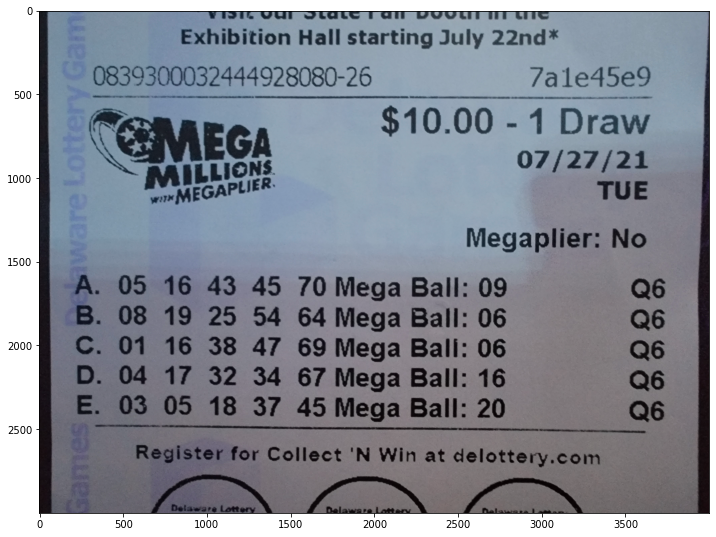

In [ ]:
LottImg = '/content/drive/MyDrive/Colab_Notebooks/Lottery_Scanner_APP/Lotto_Images/Mega_3.jpg'

# get orientation of the image
meta_orientation = get_image_orientation(LottImg)
print(meta_orientation)

# read the image
img = cv2.imread(LottImg)

# fix the orientation of the image
if meta_orientation == 270:
  img = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)
elif meta_orientation == 180:
  img = cv2.rotate(img, cv2.ROTATE_180)
elif meta_orientation == 90:
  img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)

# plot the reorientated image
plt.figure(figsize = (12,12))
plt.imshow(img)
save_path = "/content/drive/MyDrive/Colab_Notebooks/Lottery_Scanner_APP/Lotto_Images_OCR_Extracted/"
plt.savefig(save_path + "Example_Image.jpg", bbox_inches='tight', pad_inches=0)
print('\n')

## Check the prizes won from the lotto ticket


1.   Perform text recognition on multiple lotto ticket images in a directory to extract lotto numbers
2.   Extract from lotto ticket - <font color=”green”> Ticket type, Draw Date, Numbers, Mega or Power balls and Multiplier </font>

1.   Recognize the type of the lotto ticket and utilize the extracted drawing date to obtain the winning numbers, ball and multiplier using the Socrata API
2.   Check matches with the winning numbers and get the number of matches. For ball it is either 1 (matched) or 0 (not matched)

1.   Determine the prize won for each lotto ticket








In [ ]:
def main_lotto_check(LottImg, Image_name):

    '''@ Load single lotto ticket and fix orientation'''
    # get orientation of the image
    meta_orientation = get_image_orientation(LottImg)
    # read the image
    img = cv2.imread(LottImg)
    # fix the orientation of the image
    if meta_orientation == 270:
        img = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)
    elif meta_orientation == 180:
        img = cv2.rotate(img, cv2.ROTATE_180)
    elif meta_orientation == 90:
        img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
    # plot the reorientated image
    plt.figure(figsize=(12, 12))
    plt.imshow(img)


    '''@ Perform text recognition to extract lotto numbers'''
    # detail can provide information about bounding boxes
    # output:- bounding boxes, value detected, confidence factor
    reader = easyocr.Reader(['en'], gpu=True)
    reader_results = reader.readtext(img, detail=1, paragraph=False, width_ths=2.1, ycenter_ths=0.3, add_margin=0.15)
    # For more parameter info:- https://www.jaided.ai/easyocr/documentation/
    for (bbox, text, prob) in reader_results:
        # define bounding boxes, tl: top left
        (tl, tr, br, bl) = bbox
        tl = (int(tl[0]), int(tl[1]))
        tr = (int(tr[0]), int(tr[1]))
        br = (int(br[0]), int(br[1]))
        bl = (int(bl[0]), int(bl[1]))
        # remove non-ascii characters to display clean text on the image. Join cause results for each independent recognized character
        # ord returns a unicode for each character
        # The first 128 Unicode code points represent the ASCII characters
        text = "".join([c if ord(c) < 128 else "" for c in text]).strip()
        # putting rectangles and text on the image
        cv2.rectangle(img, tl, br, (0, 0, 255), 9)  # define the rectangle to be put over the text
    # show the image with bounding boxes
    plt.figure(figsize=(12, 12))
    plt.imshow(img)
    save_path = "/content/drive/MyDrive/Colab_Notebooks/Lottery_Scanner_APP/Lotto_Images_OCR_Extracted/"
    plt.savefig(save_path + Image_name, bbox_inches='tight', pad_inches=0)


    '''@ Extract information from lotto ticket image'''
    extracted_text = [replace_Q(tuple[1]) for tuple in reader_results]
    # Check if Powerball of MegaMillions
    lotto_type = get_ticket_type(extracted_text)
    # numbers and balls
    _numbers, _balls = find_Ticket_BallsNumbs(extracted_text)
    # Megaplier only occurs once for single ticket
    ticket_multiplier = find_multiplier(extracted_text).strip()
    # Draw date only occurs once for single ticket'
    drawDate = find_draw_date(extracted_text)
    unixDrawDate = convert_date_to_unix(drawDate)
    # print(f'Ticket Type is: {lotto_type}')
    # print(f'Ticket Draw Date is: {drawDate}')
    # print(f'Ticket Unix Draw Date is: {unixDrawDate}')


    '''@ Recognize the type of the lotto ticket and 
    utilize the extracted drawing date to obtain the 
    winning numbers, ball and multiplier from the Socrata database'''
    if lotto_type == 'Mega Millions':
        print('...loading Mega Millions database')
        tocheck_df = mmdf.copy()
    elif lotto_type == 'Powerball':
        print('...loading Powerball database')
        tocheck_df = pbdf.copy()
    win_numbers, win_ball, win_multiplier = get_drawn_winning_row(tocheck_df, unixDrawDate)


    '''@ Check matches with the winning numbers and get the number of matches. 
    For ball it is either 1 (matched) or 0 (not matched)'''
    # print('-----Ticket values-----')
    # print(_numbers)
    # print(_balls)
    # print(ticket_multiplier)
    # print('-----Winning values-----')
    # print(win_numbers)
    # print(win_ball)
    # print(win_multiplier)
    matches_numb = [compare_TickNumbsToWinNumbs(numb_lst, win_numbers) for numb_lst in _numbers]
    matches_ball = [compare_TickBallToWinBall(megaball, win_ball) for megaball in _balls]
    # print('-----Number of matches-----')
    # print(matches_numb)
    # print(matches_ball)


    '''@ Zip the matches'''
    #print('-----Zip the matches-----')
    _matches_numb_balls_lst = list(zip(matches_numb, matches_ball))
    #print(_matches_numb_balls_lst)


    '''@ Check the prizes won from the lotto ticket'''
    total_prize_money = check_prize_won(_matches_numb_balls_lst, ticket_multiplier, win_multiplier, lotto_type)
    # print('-----Draw Date: Total won from ticket-----')
    date_prize_ = [lotto_type, 
                   unix_to_date(unixDrawDate),
                   _numbers, 
                   _balls, 
                   ticket_multiplier, 
                   win_numbers, 
                   win_ball, 
                   win_multiplier, 
                   _matches_numb_balls_lst,
                   total_prize_money]        
    # print(date_prize_)
    # print('\n')
    # print('-----------------------------------------')
    # print('\n')


    return date_prize_

## Print extracted and matched information

  0%|          | 0/10 [00:00<?, ?it/s]

File: /content/drive/MyDrive/Colab_Notebooks/Lottery_Scanner_APP/Lotto_Images/Mega_1.jpg
File name: Mega_1.jpg
Orientation              : 6


 10%|█         | 1/10 [00:09<01:21,  9.08s/it]

string utilized to check the ticket type: MEGA
string utilized to check the ticket type: Megaplier: Yes
string utilized to check the ticket type: 06 37 42 55 62 Mega Ball: 11
string utilized to check the ticket type: MEGAPLIER'
...loading Mega Millions database
... Checking prize won for Mega Millions
-----------------------------------------------


CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 4.77 µs
File: /content/drive/MyDrive/Colab_Notebooks/Lottery_Scanner_APP/Lotto_Images/Mega_3.jpg
File name: Mega_3.jpg
Orientation              : 6


 20%|██        | 2/10 [00:14<00:57,  7.21s/it]

string utilized to check the ticket type: MEGA
string utilized to check the ticket type: Megaplier: No
string utilized to check the ticket type: A 05 16 43 45 70 Mega Ball: 09
string utilized to check the ticket type: B. 08 19 25 54 64 Mega Ball: 06
string utilized to check the ticket type: C. 01 16 38 47 69 Mega Ball: 06
string utilized to check the ticket type: D: 04 17 32 34 67 Mega Ball: 16
string utilized to check the ticket type: E._0305 18 37 45 Mega Ball: 20
string utilized to check the ticket type: MEGAPLIER:
...loading Mega Millions database
... Checking prize won for Mega Millions
-----------------------------------------------


CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 4.77 µs
File: /content/drive/MyDrive/Colab_Notebooks/Lottery_Scanner_APP/Lotto_Images/Power_1.jpg
File name: Power_1.jpg
Orientation              : 3


 30%|███       | 3/10 [00:20<00:44,  6.42s/it]

string utilized to check the ticket type: Power
string utilized to check the ticket type: A_17.33/35 48 59   Powerball: 16 --
string utilized to check the ticket type: POWERBALL drawings now
...loading Powerball database
... Checking prize won for Powerball
-----------------------------------------------


CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.91 µs
File: /content/drive/MyDrive/Colab_Notebooks/Lottery_Scanner_APP/Lotto_Images/Power_2.jpg
File name: Power_2.jpg
Orientation              : 1


 40%|████      | 4/10 [00:26<00:36,  6.13s/it]

string utilized to check the ticket type: Power Play: No
string utilized to check the ticket type: A. 22 29 32 53 55 Powerball: 25
string utilized to check the ticket type: B.13/29 47 51 63 Powerball: 13
...loading Powerball database
... Checking prize won for Powerball
-----------------------------------------------


CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 4.77 µs
File: /content/drive/MyDrive/Colab_Notebooks/Lottery_Scanner_APP/Lotto_Images/Mega_2.jpg
File name: Mega_2.jpg
Orientation              : 6


 50%|█████     | 5/10 [00:31<00:29,  5.85s/it]

string utilized to check the ticket type: MEGA
string utilized to check the ticket type: Megaplier: No
string utilized to check the ticket type: A 10 12 35 54 60 Mega Ball: 02
string utilized to check the ticket type: B._06 11_26_27 41 Mega Ball: 15
string utilized to check the ticket type: MEGAPLIER'
...loading Mega Millions database
... Checking prize won for Mega Millions
-----------------------------------------------


CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 4.77 µs
File: /content/drive/MyDrive/Colab_Notebooks/Lottery_Scanner_APP/Lotto_Images/Mega_4.jpg
File name: Mega_4.jpg
Orientation              : 6


 60%|██████    | 6/10 [00:37<00:22,  5.73s/it]

string utilized to check the ticket type: MEGA
string utilized to check the ticket type: Megaplier: No
string utilized to check the ticket type: 19 37 44 46 52 Mega Ball: 17
string utilized to check the ticket type: 04 10 20 33 60 Mega Ball: 06
string utilized to check the ticket type: C. 40 54 60 63 68 Mega Ball: 12
string utilized to check the ticket type: MEGAPLIER'
...loading Mega Millions database
... Checking prize won for Mega Millions
-----------------------------------------------


CPU times: user 2 µs, sys: 1 µs, total: 3 µs
Wall time: 4.77 µs
File: /content/drive/MyDrive/Colab_Notebooks/Lottery_Scanner_APP/Lotto_Images/Power_3.jpg
File name: Power_3.jpg
Orientation              : 6


 70%|███████   | 7/10 [00:42<00:17,  5.71s/it]

string utilized to check the ticket type: Power Play: Yes
string utilized to check the ticket type: 24 26 46 52 67 Powerball: 09
string utilized to check the ticket type: 12 38 41 4658 Powerball: 04
string utilized to check the ticket type: C. 05 14 23 36 66 Powerball: 04
string utilized to check the ticket type: 43 45 54 64 67 Powerball: 07
string utilized to check the ticket type: 23 28 50 61 64 Powerball: 24
string utilized to check the ticket type: POWERBALL drawings now
...loading Powerball database
... Checking prize won for Powerball
-----------------------------------------------


CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.25 µs
File: /content/drive/MyDrive/Colab_Notebooks/Lottery_Scanner_APP/Lotto_Images/Power_4.jpg
File name: Power_4.jpg
Orientation              : 6


 80%|████████  | 8/10 [00:48<00:11,  5.69s/it]

string utilized to check the ticket type: Power Play: No
string utilized to check the ticket type: 09 39 43 44 52 Powerball: 17
string utilized to check the ticket type: B. 04 25 26 29 61 Powerball: 09
string utilized to check the ticket type: 24 50 54 55 63 Powerball: 03
string utilized to check the ticket type: POWERBALL drawings now
...loading Powerball database
... Checking prize won for Powerball
-----------------------------------------------


CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.01 µs
File: /content/drive/MyDrive/Colab_Notebooks/Lottery_Scanner_APP/Lotto_Images/Power_5.jpg
File name: Power_5.jpg
Orientation              : 6


 90%|█████████ | 9/10 [00:53<00:05,  5.62s/it]

string utilized to check the ticket type: POwERPIAY
string utilized to check the ticket type: Power Play: No
string utilized to check the ticket type: A. 41 45 55 57 64 Powerball: 26
...loading Powerball database
... Checking prize won for Powerball
-----------------------------------------------


CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 4.77 µs
File: /content/drive/MyDrive/Colab_Notebooks/Lottery_Scanner_APP/Lotto_Images/Mega_5.jpg
File name: Mega_5.jpg
Orientation              : 6


100%|██████████| 10/10 [00:59<00:00,  5.93s/it]

string utilized to check the ticket type: POWERBALL Promo 9 Semi-Finalist
string utilized to check the ticket type: MEGA
string utilized to check the ticket type: Megaplier: Yes
string utilized to check the ticket type: 08 2432 38 62 Mega Ball: 17
string utilized to check the ticket type: MEGAPLIER:
...loading Mega Millions database
... Checking prize won for Mega Millions
-----------------------------------------------


CPU times: user 2 µs, sys: 1 µs, total: 3 µs
Wall time: 5.01 µs


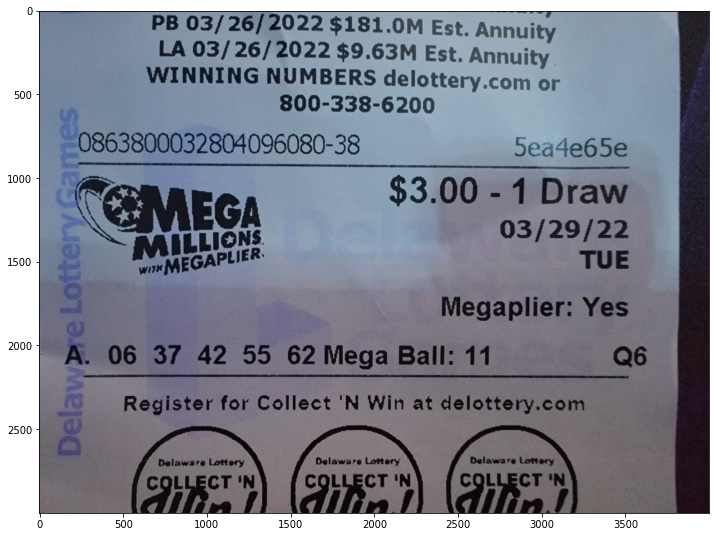

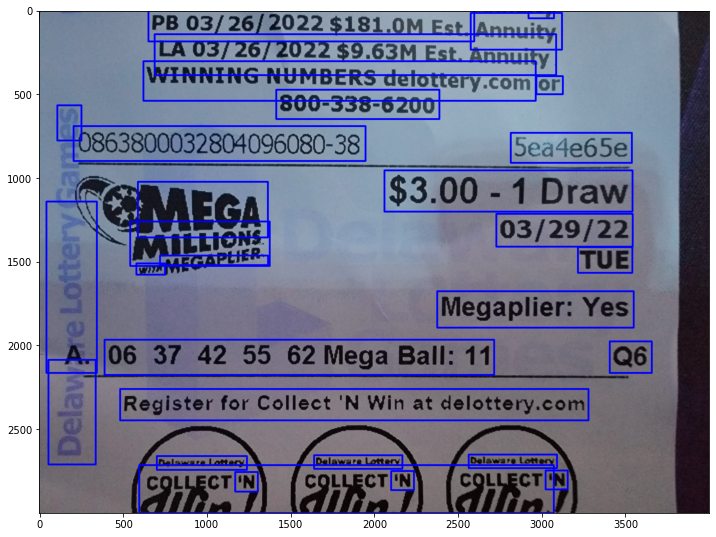

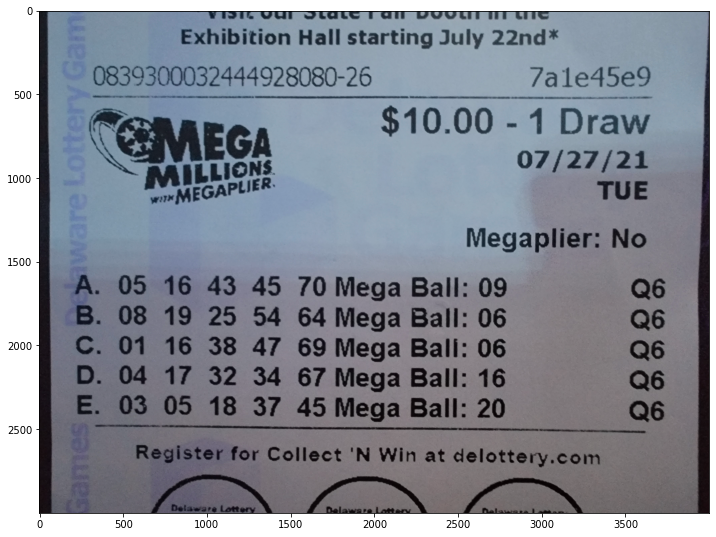

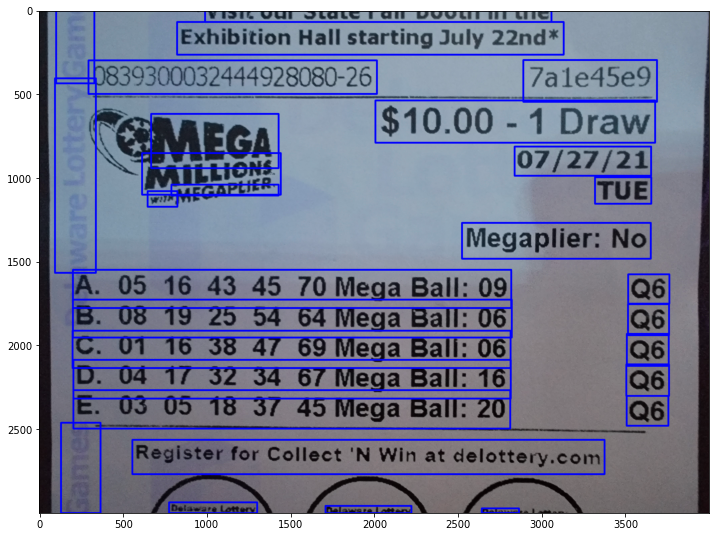

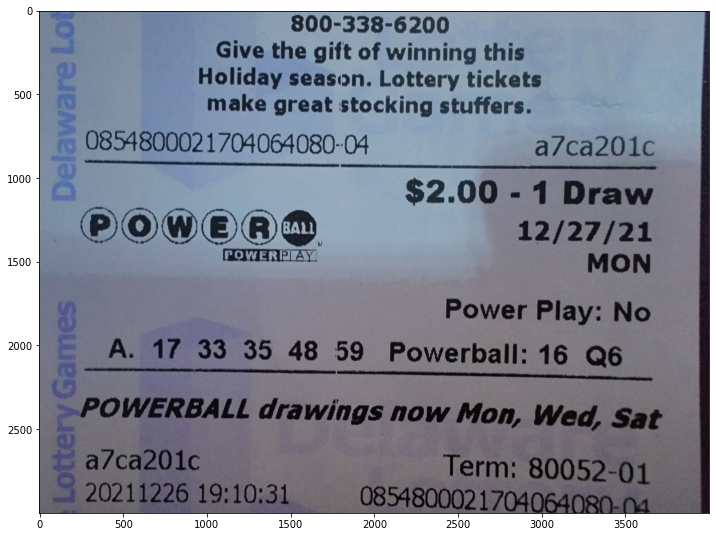

...

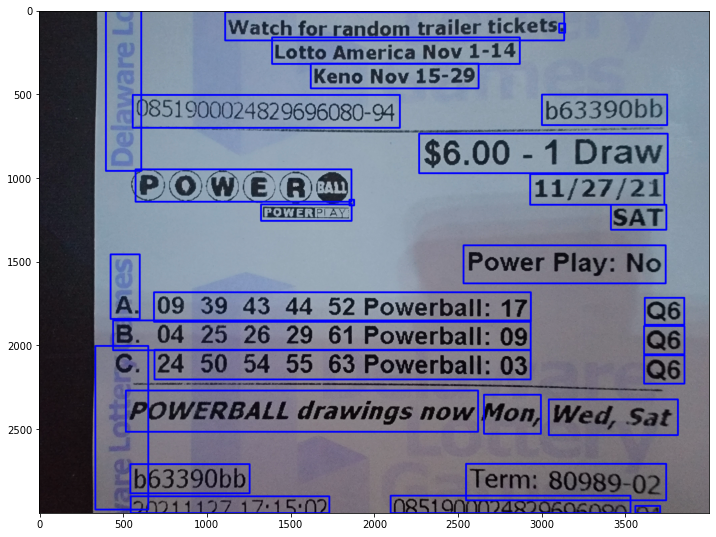

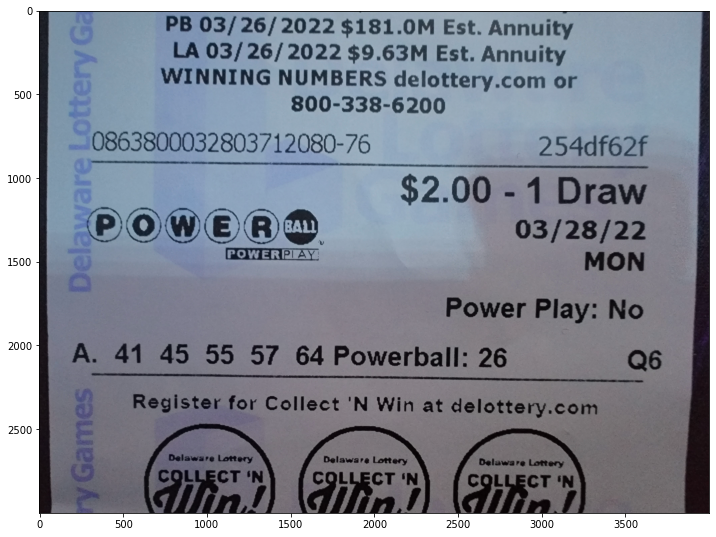

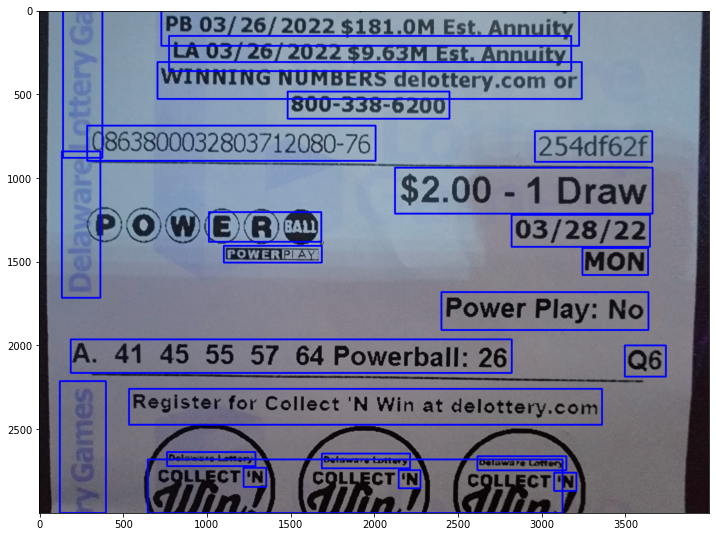

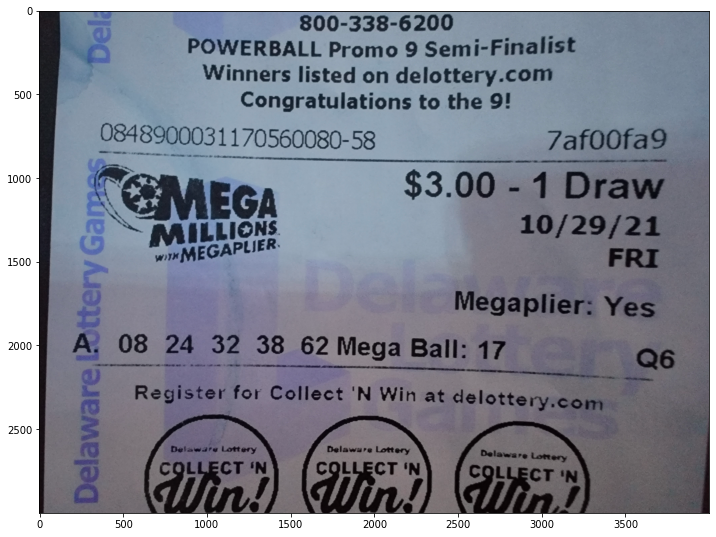

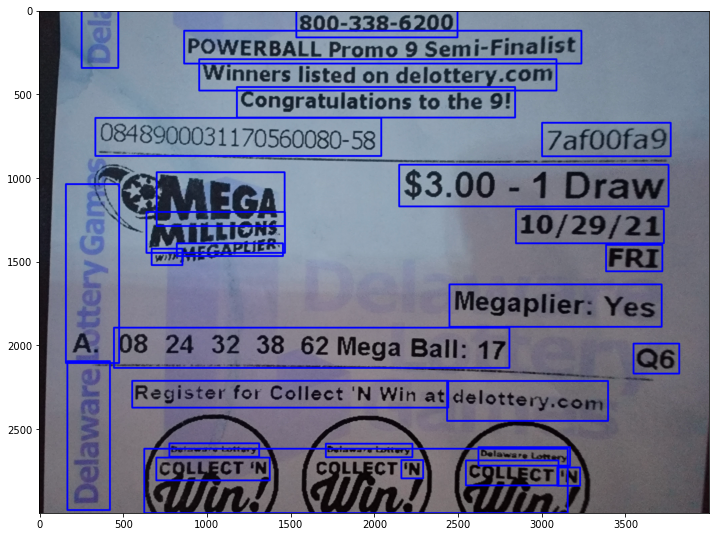

In [ ]:
path = "/content/drive/MyDrive/Colab_Notebooks/Lottery_Scanner_APP/Lotto_Images/*.*"

date_prize_dic = {}
for file in tqdm(glob.glob(path)):
    image_name = os.path.basename(file)
    print(f'File: {file}')
    print(f'File name: {image_name}')
    outputLst = main_lotto_check(file, image_name)
    date_prize_dic[image_name] = outputLst
    print("-----------------------------------------------")
    print("\n")
    %time

## Printing and File writing functions

In [ ]:
def print_dict(dictionary):
    '''print the values of the dictionary containing extracted lotto numbers and winnings'''

    for key, value in dictionary.items():
        print(f"IMAGE NAME: {key}")
        print(f"LOTTO NAME: {value[0]}")
        print(f"Lottery Date: {value[1]}")
        print("Lottery Ticket Numbers:")
        if len(value[2]) > 1:
            for i in range(len(value[2])):
                print(f"{i+1}st Number: {value[2][i]}")
        else:
            print(f"1st Number: {value[2][0]}")
        print(f"Lottery Ticket Ball: {value[3]}")
        print(f"Lottery Ticket Multiplier: {value[4]}")
        print("------      ------")
        print(f"Winning Numbers:, {value[5]}")
        print(f"Winning ball: {value[6]}")
        print(f"Winning Multiplier: {value[7]}")
        print("------      ------")
        print("Matches")
        if len(value[8]) > 1:
            for i in range(len(value[8])):
                print(f"{i+1}st Number match: {value[8][i][0]}, {i+1}st ball match: {value[8][i][1]}")
        else:
            print(value[8])
        print(f"1st Number match: {value[8][0][0]}, 1st ball match: {value[8][0][1]}")
        print("------      ------")
        if value[9] > 0:
            ASCII_art_1 = pyfiglet.figlet_format("YOU WON !")
            print(ASCII_art_1)
            print(f"$$$ PRIZE WON $$$: ${value[9]}")
        else:
            print(f"No prizes won yet: {value[9]}")

        print("SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSS")
        print('\n')


def write_dict_tofile(dictionary, file_path):
    '''write the values of the dictionary containing extracted lotto numbers and winnings'''

    with open(file_path + "Lotto_ALL_Information.txt", 'w') as f:
        for key, value in dictionary.items():
            f.write(f"IMAGE NAME: {key}\n")
            f.write(f"LOTTO NAME: {value[0]}\n")
            f.write(f"Lottery Date: {value[1]}\n")
            f.write("Lottery Ticket Numbers:\n")
            if len(value[2]) > 1:
                for i in range(len(value[2])):
                    f.write(f"{i+1}st Number: {value[2][i]}\n")
            else:
                f.write(f"1st Number: {value[2][0]}\n")
            f.write(f"Lottery Ticket Ball: {value[3]}\n")
            f.write(f"Lottery Ticket Multiplier: {value[4]}\n")
            f.write("------      ------\n")
            f.write(f"Winning Numbers: {value[5]}\n")
            f.write(f"Winning ball: {value[6]}\n")
            f.write(f"Winning Multiplier: {value[7]}\n")
            f.write("------      ------\n")
            f.write("Matches\n")
            if len(value[8]) > 1:
                for i in range(len(value[8])):
                    f.write(f"{i+1}st Number match: {value[8][i][0]}, {i+1}st ball match: {value[8][i][1]}\n")
            else:
                f.write(str(value[8]))
                f.write("\n")
            f.write(f"1st Number match: {value[8][0][0]}, 1st ball match: {value[8][0][1]}\n")
            f.write("------      ------\n")
            if value[9] > 0:
                ASCII_art_1 = pyfiglet.figlet_format("YOU WON !")
                f.write(ASCII_art_1)
                f.write("\n")
                f.write(f"$$$ PRIZE WON $$$: ${value[9]}\n")
            else:
                f.write(f"No prizes won yet: {value[9]}\n")
    
            f.write("SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSS\n")


def write_dict_tofile_WINNING(dictionary, file_path):
    '''write the WINNING values of the dictionary containing extracted lotto numbers and winnings'''

    with open(file_path + "Lotto_WINNING_Information.txt", 'w') as f:
        for key, value in dictionary.items():
            if value[9] > 0:
                f.write(f"IMAGE NAME: {key}\n")
                f.write(f"LOTTO NAME: {value[0]}\n")
                f.write(f"Lottery Date: {value[1]}\n")
                f.write("Lottery Ticket Numbers:\n")
                if len(value[2]) > 1:
                    for i in range(len(value[2])):
                        f.write(f"{i+1}st Number: {value[2][i]}\n")
                else:
                    f.write(f"1st Number: {value[2][0]}\n")
                f.write(f"Lottery Ticket Ball: {value[3]}\n")
                f.write(f"Lottery Ticket Multiplier: {value[4]}\n")
                f.write("------      ------\n")
                f.write(f"Winning Numbers: {value[5]}\n")
                f.write(f"Winning ball: {value[6]}\n")
                f.write(f"Winning Multiplier: {value[7]}\n")
                f.write("------      ------\n")
                f.write("Matches\n")
                if len(value[8]) > 1:
                    for i in range(len(value[8])):
                        f.write(f"{i+1}st Number match: {value[8][i][0]}, {i+1}st ball match: {value[8][i][1]}\n")
                else:
                    f.write(str(value[8]))
                    f.write("\n")
                f.write(f"1st Number match: {value[8][0][0]}, 1st ball match: {value[8][0][1]}\n")
                f.write("------      ------\n")
                ASCII_art_1 = pyfiglet.figlet_format("YOU WON !")
                f.write(ASCII_art_1)
                f.write("\n")
                f.write(f"$$$ PRIZE WON $$$: ${value[9]}\n")
        
                f.write("SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSS\n")

## Print the results

In [ ]:
print_dict(date_prize_dic)

IMAGE NAME: Mega_1.jpg
LOTTO NAME: Mega Millions
Lottery Date: 03-29-2022
Lottery Ticket Numbers:
1st Number: ['06', '37', '42', '55', '62']
Lottery Ticket Ball: ['11']
Lottery Ticket Multiplier: Yes
------      ------
Winning Numbers:, ['07', '22', '36', '45', '47']
Winning ball: 12
Winning Multiplier: 2
------      ------
Matches
[(0, 0)]
1st Number match: 0, 1st ball match: 0
------      ------
No prizes won yet: 0
SSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSSS


IMAGE NAME: Mega_3.jpg
LOTTO NAME: Mega Millions
Lottery Date: 07-27-2021
Lottery Ticket Numbers:
1st Number: ['05', '16', '43', '45', '70']
2st Number: ['08', '19', '25', '54', '64']
3st Number: ['01', '16', '38', '47', '69']
4st Number: ['04', '17', '32', '34', '67']
5st Number: ['03', '05', '18', '37', '45']
Lottery Ticket Ball: ['09', '06', '06', '16', '20']
Lottery Ticket Multiplier: No
------      ------
Winning Numbers:, ['02', '35', '36', '54', '64']
Winnin

## Write results to a file

In [ ]:
file_path = "/content/drive/MyDrive/Colab_Notebooks/Lottery_Scanner_APP/"
write_dict_tofile(date_prize_dic, file_path)
write_dict_tofile_WINNING(date_prize_dic, file_path)